En este notebook voy a explorar y analizar como quedó el grafo armado. También lo voy a comparar con un subgrafo de primeKG.

# Importo librerías y cargo datos

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import networkx as nx
import igraph as ig 
from matplotlib_venn import venn3, venn2
import random
import plotly.io as pio

In [73]:
data_processed = "../../data/processed/"
data_interim = "../../data/interim/"

graph_node_data = pd.read_csv(data_processed+"graph_node_table.csv", index_col=0)
graph_edge_data = pd.read_csv(data_processed+"graph_edge_table.csv",index_col=0).rename(columns={"relation":"edge_type"})

prime_node_data = pd.read_csv(data_interim+"primekg_exploring_node_table.csv", index_col=0)
prime_edge_data = pd.read_csv(data_interim+"primekg_exploring_graph_edge_table.csv",index_col=0).rename(columns={"relation":"edge_type"})

seed = 16
random.seed(seed)

/tmp/ipykernel_90723/3962340022.py:5: DtypeWarning:

Columns (4,5) have mixed types. Specify dtype option on import or set low_memory=False.



In [3]:
#esto es para forzar a plt a poner fondos blancos en las figuras aunque el tema del notebook sea oscuro
plt.rcParams['axes.facecolor'] = 'white'
plt.rcParams['figure.facecolor'] = 'white'
cmap = plt.get_cmap("tab10")
pio.templates.default = "seaborn"

In [4]:
display(graph_edge_data.head())
display(graph_node_data.head())

,edge_idx,a_idx,b_idx,a_id,b_id,edge_type,a_type,b_type,source,source_idx,score,YearInitial,YearFinal
1,1,3823,9704,3440,C0000737,GDA,gene/protein,disease,disgenet,26518,0.30,1997.0,1997.0
2,2,4763,9705,4547,C0000744,GDA,gene/protein,disease,disgenet,34865,0.80,1985.0,2019.0
3,3,525,9706,10683,C0000768,GDA,gene/protein,disease,disgenet,63589,0.33,2002.0,2011.0
4,4,1116,9706,1295,C0000768,GDA,gene/protein,disease,disgenet,11121,0.30,2008.0,2008.0
5,5,1155,9706,1317,C0000768,GDA,gene/protein,disease,disgenet,11360,0.30,2001.0,2001.0


,node_idx,node_id,node_type,node_name,node_source,disgenet_type,diseaseClassMSH,diseaseClassNameMSH
1,1,1,gene/protein,A1BG,disgenet,NaN,NaN,NaN
2,2,10,gene/protein,NAT2,disgenet,NaN,NaN,NaN
3,3,100,gene/protein,ADA,disgenet,NaN,NaN,NaN
4,4,1000,gene/protein,CDH2,disgenet,NaN,NaN,NaN
5,5,10000,gene/protein,AKT3,disgenet,NaN,NaN,NaN


# Estudio capas
Extraje 3 subgrafos del grafo principal, según tipo de enlace: disease-disease, gda o ppi. Cada grafo contiene solo los nodos que están involucrados en enlaces de ese tipo.
El subgrafo gda es básicamente la red DisGeNET, disease-disease contiene tanto nodos de DisGeNET como de PrimeKG y ppi tiene nodos de hippie y disgenet.
Por un lado, quiero ver si logré una buena cobertura de DisGeNET al mergearla con estas redes: idealmente obtuve muchos enlaces que interconectan nodos de disgenet y la complementé con nodos nuevos.
Por otro lado, quiero estudiar como es cada red por separado y como se relacionan entre sí. 
También dividí primekg en dos grafos, para ver si la red gda y disease-disease que se obtiene solo usando primekg es similar a la que yo armé (y si tiene los mismos problemas que la mía).

Por último exporté todos los grafos en .gml para hacer visualizaciones en gephi

In [5]:
def attributes_from_pd(G:nx.Graph,df:pd.DataFrame,attributes:dict,indexcol):
    """Dados un grafo G y un dataframe df con atributos de sus nodos, especificamos los atributos
    que queremos agregar a los nodos en un diccionario con formato {nombre_columna:nombre_atributo}. 
    La función arma un diccionario con los atributos y el nombre que le queremos poner, indexado con el identificador de nodo que elegimos 
    y los asigna a los nodos del grafo"""
    for attribute,name in attributes.items():
        nx.set_node_attributes(G,pd.Series(df.set_index(indexcol)[attribute]).to_dict(),name)

def get_node_dict(G):
    return {node:data for (node,data) in list(G.nodes(data=True))}

Armo los grafos y asigno atributos

In [6]:
#Mi grafo
G = nx.from_pandas_edgelist(graph_edge_data,source="a_idx",target="b_idx", edge_attr=["edge_type","YearInitial","YearFinal","score","edge_idx"])
G_attributes = {"node_type":"node_type","node_name":"node_name","node_id":"node_id","node_source":"node_source","disgenet_type":"disgenet_type","diseaseClassMSH":"diseaseClassMSH","diseaseClassNameMSH":"diseaseClassNameMSH"}

edges_enfermedades = graph_edge_data[graph_edge_data.edge_type == "parent_child_mondo"]
nodos_enfermedades = graph_node_data[graph_node_data.node_type == "disease"]
DD = nx.from_pandas_edgelist(edges_enfermedades,source="a_idx",target="b_idx",edge_attr="edge_idx")
DD_attributes = {"node_type":"node_type","node_name":"node_name","node_id":"node_id","node_source":"node_source","disgenet_type":"disgenet_type","diseaseClassMSH":"diseaseClassMSH","diseaseClassNameMSH":"diseaseClassNameMSH"}

edges_proteinas = graph_edge_data[(graph_edge_data.edge_type == "PPI") | (graph_edge_data.edge_type == "forms_complex")]
nodos_proteinas = graph_node_data[(graph_node_data.node_type == "gene/protein") | (graph_node_data.node_type == "protein_complex")]
PPI = nx.from_pandas_edgelist(edges_proteinas,source="a_idx",target="b_idx",edge_attr="edge_idx")
PPI_attributes = {"node_type":"node_type","node_name":"node_name","node_id":"node_id","node_source":"node_source"}

edges_gda = graph_edge_data[graph_edge_data.edge_type == "GDA"]
nodos_gda = graph_node_data[graph_node_data.node_source == "disgenet"]
GDA = nx.from_pandas_edgelist(edges_gda,source="a_idx",target="b_idx",edge_attr="edge_idx")
GDA_attributes = {"node_type":"node_type","node_name":"node_name","node_id":"node_id","node_source":"node_source","disgenet_type":"disgenet_type","diseaseClassMSH":"diseaseClassMSH","diseaseClassNameMSH":"diseaseClassNameMSH"}

for network,attr in zip([G,DD,PPI,GDA],[G_attributes,DD_attributes,PPI_attributes,GDA_attributes]):
    attributes_from_pd(network,graph_node_data,attr,"node_idx")

#Grafo de PrimeKG
PKG = nx.from_pandas_edgelist(prime_edge_data,source="a_index",target="b_index", edge_attr="edge_type")
PKG_attributes = {"node_type":"node_type","node_name":"node_name","node_id":"node_id","node_source":"node_source","mondo":"mondo","CUI":"CUI"}

pkg_edges_enfermedades = prime_edge_data[prime_edge_data.edge_type == "disease_disease"]
pkg_nodos_enfermedades = prime_node_data[prime_node_data.node_type == "disease"]
PKG_DD = nx.from_pandas_edgelist(pkg_edges_enfermedades,source="a_index",target="b_index",edge_attr="edge_type")
PKG_DD_attributes = {"node_type":"node_type","node_name":"node_name","node_id":"node_id","node_source":"node_source","mondo":"mondo","CUI":"CUI"}

pkg_edges_gda = prime_edge_data[prime_edge_data.edge_type == "gda"]
PKG_GDA = nx.from_pandas_edgelist(pkg_edges_gda,source="a_index",target="b_index",edge_attr="edge_type")
PKG_GDA_attributes = {"node_type":"node_type","node_name":"node_name","node_id":"node_id","node_source":"node_source","mondo":"mondo","CUI":"CUI"}

for network,attr in zip([PKG,PKG_DD,PKG_GDA],[PKG_attributes,PKG_DD_attributes,PKG_GDA_attributes]):
    attributes_from_pd(network,prime_node_data,attr,"node_index")

### Cantidad de nodos y enlaces de cada grafo

In [7]:
graphs = {"Mi Grafo":G, "Disease layer":DD, "Protein layer":PPI, "GDA": GDA, "PrimeKG":PKG, "PrimeKG disease layer":PKG_DD, "PrimeKG gda": PKG_GDA}
stats = {name:{"Número de nodos":graph.number_of_nodes(), "Número de enlaces":graph.number_of_edges()} for name,graph in graphs.items()}
display(pd.DataFrame(stats))

,Mi Grafo,Disease layer,Protein layer,GDA,PrimeKG,PrimeKG disease layer,PrimeKG gda
Número de nodos,35642,9664,15529,20884,26124,17008,14673
Número de enlaces,249840,15213,150589,84038,112605,32194,80411


### Overlap de nodos de cada sub-red

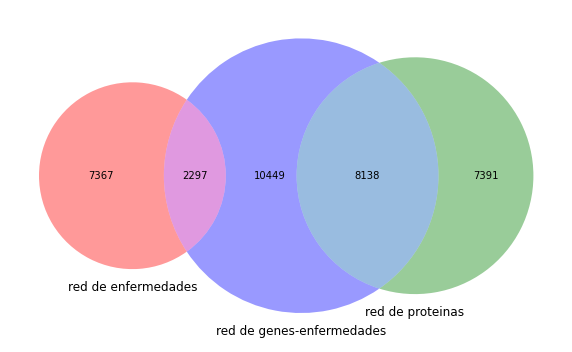

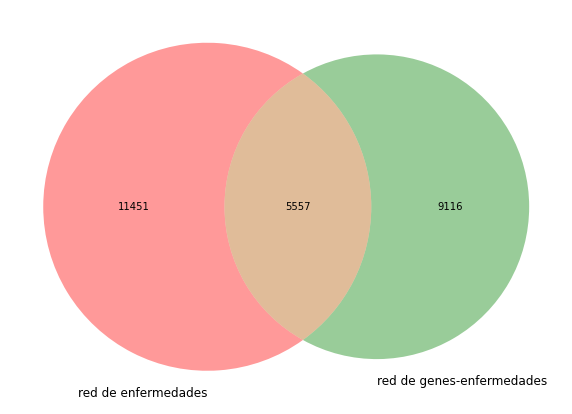

In [8]:
plt.figure(figsize=[10, 8])
plt.tight_layout()
plt.plot(title='Nodos en comun')

networks = {"red de enfermedades":DD, "red de proteinas":PPI, "red de genes-enfermedades":GDA}

(n1, g1), (n2, g2), (n3, g3) = networks.items()
s1, s2, s3 = set(g1), set(g2), set(g3)
'''para dos sets s,t python tiene las siguientes operaciones:
    union: s | t, interseccion: s & t, differencia: s - t
    Se usa esto para definir cuántos elementos hay en cada sección del diagrama'''
center = len(s1 & s2 & s3)
v1 = venn3([s1,s2,s3], set_labels=[n1,n2,n3])

plt.figure(figsize=[10, 8])
plt.tight_layout()
plt.plot(title='Nodos en comun')

networks = {"red de enfermedades":PKG_DD, "red de genes-enfermedades":PKG_GDA}

(n1, g1), (n2, g2) = networks.items()
s1, s2 = set(g1), set(g2)
'''para dos sets s,t python tiene las siguientes operaciones:
    union: s | t, interseccion: s & t, differencia: s - t
    Se usa esto para definir cuántos elementos hay en cada sección del diagrama'''
center = len(s1 & s2)
v2 = venn2([s1,s2], set_labels=[n1, n2])


Veo especificamente enfermedades

Cobertura en mi grafo: 21%
Cobertura en PrimeKG: 35%


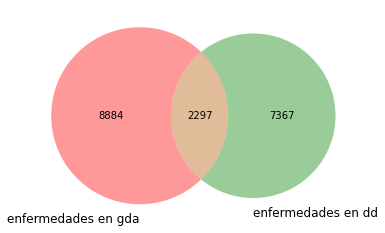

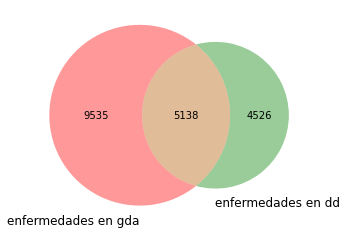

In [9]:
enfermedades_gda = nodos_gda[nodos_gda.node_type == "disease"]
s1,n1 = set(enfermedades_gda["node_idx"]),"enfermedades en gda"
s2,n2 = set(DD), "enfermedades en dd"

plt.figure()
v = venn2([s1,s2],set_labels=[n1,n2])
cobertura_mg = (len(s1&s2)*100)/len(s1)


genes_kg = prime_node_data[prime_node_data.node_type == "gene"]
s1,n1 = set(PKG_GDA),"gda gen+enf"
s2,n2 = set(DD), "enfermedades en dd"
s3,n3 = set(genes_kg["node_index"]), "genes gda"

s4,n4 = (s1 - s3), "enfermedades en gda"

plt.figure()
v = venn2([s4,s2],set_labels=[n4,n2])

cobertura_kg = (len(s4&s2)*100)/len(s4)

print(f"Cobertura en mi grafo: {round(cobertura_mg)}%")
print(f"Cobertura en PrimeKG: {round(cobertura_kg)}%")

# Distribución de grado

## Para red d-d, p-p y d-p

In [10]:
def get_degree_series(G,name):
    degrees = {n[0]:G.degree(n[0]) for n in G.nodes(data=True)}
    return pd.Series(degrees,name=name)

In [11]:
dd_degree = get_degree_series(DD,"degree_dd")
nodos_enfermedades = nodos_enfermedades.join(dd_degree)

fig_dd_degree = px.histogram(dd_degree, log_y=True, title="Distribución de grado - enfermedad-enfermedad")
fig_dd_degree.show()

In [12]:
ppi_degree = get_degree_series(PPI,"degree_pp")
nodos_proteinas = nodos_proteinas.join(ppi_degree)

fig_ppi_degree = px.histogram(ppi_degree, log_y=True, title="Distribución de grado - proteina-proteina")
fig_ppi_degree.show()

In [13]:
gda_degree = get_degree_series(GDA,"degree_gda")
nodos_gda = nodos_gda.join(gda_degree)

fig_gda_degree = px.histogram(gda_degree, log_y=True, title="Distribución de grado - gen-enfermedad")
fig_gda_degree.show()


Nodos en red GDA ordenados por grado de mayor a menor

In [14]:
nodos_gda.sort_values(by="degree_gda", ascending=False)

,node_idx,node_id,node_type,node_name,node_source,disgenet_type,diseaseClassMSH,diseaseClassNameMSH,degree_gda
9936,9936,C0006142,disease,Malignant neoplasm of breast,disgenet,disease,C04;C17,Neoplasms; Skin and Connective Tissue Diseases,1074
11207,11207,C0036341,disease,Schizophrenia,disgenet,disease,F03,Mental Disorders,883
10722,10722,C0023893,disease,"Liver Cirrhosis, Experimental",disgenet,disease,C23;C06,"Pathological Conditions, Signs and Symptoms; D...",774
10058,10058,C0009402,disease,Colorectal Carcinoma,disgenet,disease,C06;C04,Digestive System Diseases; Neoplasms,702
13144,13144,C0376358,disease,Malignant neoplasm of prostate,disgenet,disease,C04;C12,Neoplasms; Male Urogenital Diseases,616
...,...,...,...,...,...,...,...,...,...
13461,13461,C0432292,disease,Familial expansile osteolysis,disgenet,disease,C05,Musculoskeletal Diseases,1
13462,13462,C0432306,disease,Ichthyosis Bullosa of Siemens,disgenet,disease,C16;C17,"Congenital, Hereditary, and Neonatal Diseases ...",1
13463,13463,C0432307,disease,Ichthyosis hystrix of Curth-Macklin,disgenet,disease,NaN,NaN,1
13465,13465,C0432317,disease,"Epidermolysis bullosa simplex, Ogna type",disgenet,disease,C16;C17,"Congenital, Hereditary, and Neonatal Diseases ...",1


In [74]:
graph_node_data = pd.merge(graph_node_data,nodos_gda[["node_idx","degree_gda"]],how="left",left_on="node_idx",right_on="node_idx")
graph_node_data.degree_gda = graph_node_data.degree_gda.fillna(0)

graph_node_data = pd.merge(graph_node_data,nodos_proteinas[["node_idx","degree_pp"]],how="left",left_on="node_idx",right_on="node_idx")
graph_node_data.degree_pp = graph_node_data.degree_pp.fillna(0)

graph_node_data = pd.merge(graph_node_data,nodos_enfermedades[["node_idx","degree_dd"]],how="left",left_on="node_idx",right_on="node_idx")
graph_node_data.degree_dd = graph_node_data.degree_dd.fillna(0)

In [16]:
display(graph_node_data)

,node_idx,node_id,node_type,node_name,node_source,disgenet_type,diseaseClassMSH,diseaseClassNameMSH,degree_gda,degree_pp,degree_dd
0,1,1,gene/protein,A1BG,disgenet,NaN,NaN,NaN,2.0,10.0,0.0
1,2,10,gene/protein,NAT2,disgenet,NaN,NaN,NaN,39.0,5.0,0.0
2,3,100,gene/protein,ADA,disgenet,NaN,NaN,NaN,18.0,7.0,0.0
3,4,1000,gene/protein,CDH2,disgenet,NaN,NaN,NaN,28.0,21.0,0.0
4,5,10000,gene/protein,AKT3,disgenet,NaN,NaN,NaN,9.0,41.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
35637,35638,C3203657,disease,autoimmune retinopathy,primekg,NaN,NaN,NaN,0.0,0.0,4.0
35638,35639,C4510411,disease,growth hormone insensitivity with immune dysre...,primekg,NaN,NaN,NaN,0.0,0.0,2.0
35639,35640,C1970196,disease,adenosine kinase deficiency,primekg,NaN,NaN,NaN,0.0,0.0,2.0
35640,35641,C3272797,disease,colon serrated polyposis,primekg,NaN,NaN,NaN,0.0,0.0,1.0


## Comparo grado intra-capa e inter-capa

Quiero ver cuantos nodos me quedaron "aislados" en su capa, es decir, tienen enlaces con otra capa pero no están interconectados dentro de su capa:
K_intra_inter
K11 = enlaces inter e intra capa
K01 = solo enlaces inter capa
K10 = solo enlaces intra capa

In [17]:
def k_inter_intra(type,degree_type):
    #nodos con enlaces intercapa pero sin enlaces intra capa
    nodes_k01 = len(graph_node_data[(graph_node_data.node_type == type) & (graph_node_data.degree_gda != 0) & (graph_node_data[degree_type] == 0)])

    #nodos con enlaces intra capa y sin enlaces inter capa
    nodes_k10 = len(graph_node_data[(graph_node_data.node_type == type) & (graph_node_data.degree_gda == 0) & (graph_node_data[degree_type] != 0)])

    #nodos con enlaces intra e inter capa
    nodes_k11 = len(graph_node_data[(graph_node_data.node_type == type) & (graph_node_data.degree_gda != 0) & (graph_node_data[degree_type] != 0)])

    total = len(graph_node_data[graph_node_data.node_type == type])
    values = [(nodes_k11*100)/total, (nodes_k10*100)/total, (nodes_k01*100)/total]

    return (values)

In [18]:
k_prot = k_inter_intra("gene/protein","degree_pp")
k_enf = k_inter_intra("disease","degree_dd")

Text(0.5, 1.0, 'Nodos enfermedad')

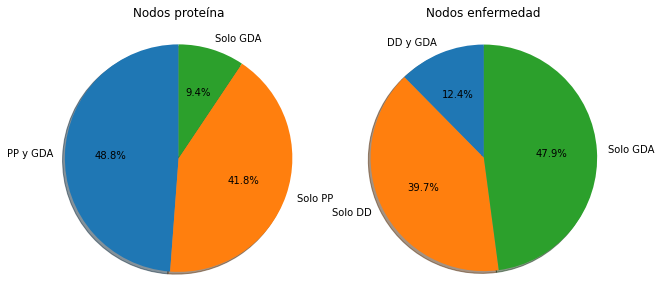

In [19]:
fig, ax = plt.subplots(1,2,figsize=(10,5))

ax[0].pie(k_prot, labels=["PP y GDA", "Solo PP", "Solo GDA"], autopct='%1.1f%%',shadow=True, startangle=90)
ax[0].axis('equal') 
ax[0].set_title("Nodos proteína")

ax[1].pie(k_enf, labels=["DD y GDA", "Solo DD", "Solo GDA"], autopct='%1.1f%%',shadow=True, startangle=90)
ax[1].axis('equal')
ax[1].set_title("Nodos enfermedad")

Distribución de grado para enfermedades -> genes y para genes -> enfermedades (para nodos con enlaces gda, es decir, no cuento grado=0)

In [20]:
fig_pd_degree = px.histogram(graph_node_data[(graph_node_data.node_type == "gene/protein") & (graph_node_data.degree_gda !=0)]["degree_gda"], log_y=True, title="Distribución de grado: nodos gen -> nodos enfermedad")
fig_pd_degree.show()


In [21]:
fig_dp_degree = px.histogram(graph_node_data[(graph_node_data.node_type == "disease") & (graph_node_data.degree_gda !=0)]["degree_gda"], log_y=True, title="Distribución de grado: nodos enfermedad -> nodos gen")
fig_dp_degree.show()

# Evolución temporal

Los enlaces de DisGeNET cuentan con la información de en qué año se registró por primera vez evidencia que respalde la asociación gen-enfermedad y en qué año se registró por última vez. 
Usando estos datos voy a estudiar la evolución temporal de la red

In [22]:
nan_count = edges_gda.YearInitial.isna().value_counts()
print(f"Hay {nan_count[True]} enlaces sin fecha, para este analisis los saco")

#hay enlaces sin fecha, para este analisis los saco
gda_year_data = edges_gda.dropna()

print(f"Me quedo con {gda_year_data.shape[0]} enlaces")
gda_year_data.astype({'YearInitial': 'int','YearFinal':'int'})

Hay 4383 enlaces sin fecha, para este analisis los saco
Me quedo con 79655 enlaces


,edge_idx,a_idx,b_idx,a_id,b_id,edge_type,a_type,b_type,source,source_idx,score,YearInitial,YearFinal
1,1,3823,9704,3440,C0000737,GDA,gene/protein,disease,disgenet,26518,0.30,1997,1997
2,2,4763,9705,4547,C0000744,GDA,gene/protein,disease,disgenet,34865,0.80,1985,2019
3,3,525,9706,10683,C0000768,GDA,gene/protein,disease,disgenet,63589,0.33,2002,2011
4,4,1116,9706,1295,C0000768,GDA,gene/protein,disease,disgenet,11121,0.30,2008,2008
5,5,1155,9706,1317,C0000768,GDA,gene/protein,disease,disgenet,11360,0.30,2001,2001
...,...,...,...,...,...,...,...,...,...,...,...,...,...
84033,84033,4743,20884,4509,C4757950,GDA,gene/protein,disease,disgenet,34556,0.30,2009,2009
84034,84034,5042,20884,498,C4757950,GDA,gene/protein,disease,disgenet,4598,0.30,2013,2013
84035,84035,5269,20884,513,C4757950,GDA,gene/protein,disease,disgenet,4620,0.30,2018,2018
84036,84036,5310,20884,514,C4757950,GDA,gene/protein,disease,disgenet,4622,0.30,2010,2010


Evolución temporal de la evidencia sobre asociaciones gen-enfermedad en DisGeNET, por fecha de primer evidencia registrada y fecha de última evidencia registrada. Grafico el histograma y también el acumulado en el tiempo.

In [23]:
fig_initial = px.histogram(gda_year_data, x="YearInitial", title="Year Initial",color_discrete_sequence=['#e377c2'])
fig_initial.show()
fig_final = px.histogram(gda_year_data, x="YearFinal", title="Year Final",color_discrete_sequence=['#e377c2'])
fig_final.show()

fig_initial_cdf = px.ecdf(gda_year_data, x="YearInitial", title="CDF Year Initial",color_discrete_sequence=['#e377c2'])
fig_initial_cdf.show()

fig_final_cdf = px.ecdf(gda_year_data, x="YearFinal", title="CDF Year Final",color_discrete_sequence=['#e377c2'])
fig_final_cdf.show()

Busco el año en el cual se acumuló determinado porcentaje de la información total

In [24]:
def ecdf_threshold(sample:np.ndarray,threshold:float) -> int:
    """Dada la columna de años como array y un corte de porcentaje acumulado,
    devuelve el año que corresponde al porcentaje acumulado en la curva ecdf"""
    x = np.sort(sample)
    y = np.arange(1,len(x)+1)/float(len(x))

    cut = int(x[np.where(y>threshold)][0])
    return cut

def ecdf_data(sample:np.ndarray) -> tuple:
    x = np.sort(sample)
    y = np.arange(1,len(x)+1)/float(len(x))
    return (x,y)

In [25]:
threshold = 0.7
initial = gda_year_data['YearInitial'].values
final = gda_year_data['YearFinal'].values

initial_cut = ecdf_threshold(initial,threshold)
final_cut = ecdf_threshold(final,threshold)

print(f"Año correspondiente a acumulado {round(threshold*100)}%:\nInitial: {initial_cut}\nFinal: {final_cut}")

Año correspondiente a acumulado 70%:
Initial: 2011
Final: 2017


Estudio la cantidad de enlaces que acumuló una enfermedad a lo largo del tiempo (estoy usando YearInitial, es decir, la fecha de la primera vez que se registró evidencia de una asociación)

{'Node name': 'IFNA2',
 '# enlaces': 170,
 'Oldest': 1986,
 'Newest': 2016,
 'Pendiente': 5.67}

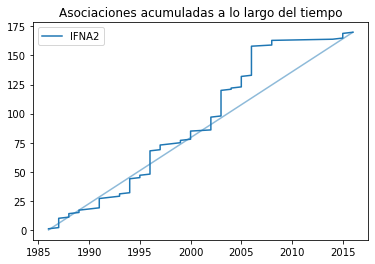

In [26]:
def k_temporal(node_index,plot=True,color=cmap(0)):

    nodetype = nodos_gda[nodos_gda.node_idx == node_index]["node_type"].values[0]

    if nodetype == "gene/protein":
        dates = gda_year_data[gda_year_data.a_idx == node_index]["YearInitial"].values
    else:
        dates = gda_year_data[gda_year_data.b_idx == node_index]["YearInitial"].values

    num_evidencia = len(dates)
    oldest = np.min(dates)
    newest = np.max(dates)

    x = np.sort(dates)
    y = np.arange(1,len(x)+1)

    if oldest-newest == 0:
        pendiente = 0
    else:
        pendiente = (num_evidencia-0)/(newest-oldest)
    stats = {"Node name": nodos_gda[nodos_gda.node_idx == node_index].node_name.values[0], "# enlaces": num_evidencia, "Oldest": int(oldest), "Newest": int(newest), "Pendiente":round(pendiente,2)}

    if plot:
        plt.plot(x,y,label=stats["Node name"], color=color)
        plt.plot(x, pendiente*(x-oldest), color=color, alpha=0.5)
        plt.title(f"Asociaciones acumuladas a lo largo del tiempo")
        plt.legend()
        

    return stats

ejemplo = 3823
temp_data = k_temporal(ejemplo)
temp_data

Hago este análisis para todos los nodos, guardo la información de primer y último enlace registrado y la pendiente.

In [27]:
temporal_data = {}
nodos_gen = np.unique(gda_year_data.a_idx.values)
nodos_enf = np.unique(gda_year_data.b_idx.values)

for nodo in np.concatenate((nodos_gen,nodos_enf)):
    temporal_data[nodo] = k_temporal(nodo,plot=False)

In [28]:
temporal_df = pd.DataFrame(temporal_data).T.sort_values(by="Pendiente")
display(temporal_df)

,Node name,# enlaces,Oldest,Newest,Pendiente
7017,ARHGEF28,1,2013,2013,0
16547,Complement Component 7 Deficiency,1,1989,1989,0
16546,"Microphthalmia, Syndromic 5",1,1997,1997,0
16545,"MICROPHTHALMIA, SYNDROMIC 6 (disorder)",1,1986,1986,0
16544,"Neuronal Ceroid Lipofuscinosis, Congenital",1,1995,1995,0
...,...,...,...,...,...
11103,Prostatic Neoplasms,615,1990,2019,21.21
2823,SIN3A,24,2015,2016,24.0
11207,Schizophrenia,882,1982,2016,25.94
10722,"Liver Cirrhosis, Experimental",774,1993,2019,29.77


Nodos con pendiente alta: 
Hay mucha evidencia acumulada a lo largo de un período extenso de tiempo, por ej, "Schizophrenia" tiene 882 enlaces acumulados entre 1982 y 2019.
También puede haber menos enlaces pero acumulados en un período corto de tiempo, como "Cholestasis, Extrahepatic" que tiene 32 enlaces acumulados entre 2017 y 2018, lo que muestra una alta actividad en la investigación de asociaciones genéticas con esa enfermedad en ese período de tiempo.

Se podría pensar como una métrica de "que tan activa está la investigación" sobre ese nodo?

Comparo las curvas para algunas enfermedades de k alto y bajo

Hay algunos casos que habría que considerar, por ejemplo, si un nodo tiene 10 enlaces pero son todos del mismo año la pendiente es 0. Si un nodo tiene un único enlace la pendiente también es cero. En este sentido la métrica no está tan buena, habría que ver como manejar esos casos. 
Por ahí sumandole el número de enlaces o algo asi?

In [29]:
#las 5 más altas
higher_k = temporal_df.sort_values(by="Pendiente", ascending=False)[0:5]

#las 5 más bajas (son 0)
zero_k = temporal_df[0:5]

#las 5 más bajas con más de 5 enlaces 
lowest_k = temporal_df[temporal_df["# enlaces"] > 5][0:5]

#5 más bajas con más de 5 enlaces y pendiente distinta de 0
lowest_k_2 = temporal_df[(temporal_df["# enlaces"] > 5) & (temporal_df.Pendiente !=0)][0:5]

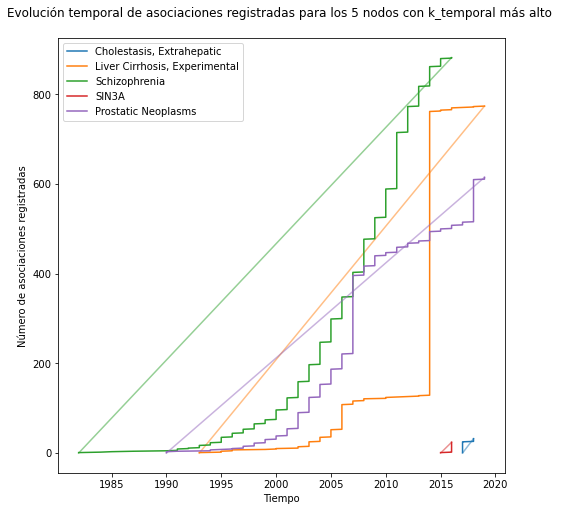

In [30]:
plt.figure(figsize=(8,8))
for i,node in enumerate(higher_k.index.values):
    k_temporal(node,plot=True,color=cmap(i))
    plt.title("Evolución temporal de asociaciones registradas para los 5 nodos con k_temporal más alto \n")
    plt.xlabel("Tiempo")
    plt.ylabel("Número de asociaciones registradas")

# Comunidades

In [31]:
def particion_a_diccionario(Red_igraph,particion_igraph):
  particion_dict = {}
  for cluster in range(len(particion_igraph)):
    for nodo in Red_igraph.vs(particion_igraph[cluster])['name']:
      particion_dict.update({nodo:cluster})
  return particion_dict

def particiones(G):
    dict = {}
    G_igraph = ig.Graph.TupleList(G.edges(), directed=False)
    comunidades_infomap  = G_igraph.community_infomap()
    dict_comunidades_infomap = particion_a_diccionario(G_igraph,comunidades_infomap)
    modularidad_infomap = G_igraph.modularity(comunidades_infomap)
    dict['Infomap'] = {'comunidades' : comunidades_infomap, 'diccionario':dict_comunidades_infomap, 'modularidad':modularidad_infomap}

    #LA FUNCIÓN COMMUNITY_MULTILEVEL DE IGRAPH UTILIZA EL ALGORITMO LOUVAIN
    G_igraph = ig.Graph.TupleList(G.edges(), directed=False)
    comunidades_louvain = G_igraph.community_multilevel()
    dict_comunidades_louvain = particion_a_diccionario(G_igraph,comunidades_louvain)
    modularidad_louvain = G_igraph.modularity(comunidades_louvain)
    dict['Louvain'] = {'comunidades' : comunidades_louvain, 'diccionario':dict_comunidades_louvain, 'modularidad':modularidad_louvain}
    return dict

In [75]:
comunidades_dd = particiones(DD)
#comunidades_ppi = particiones(ppi)
#%%
col_infomap = pd.Series(comunidades_dd['Infomap']['diccionario'],name="comunidades_infomap")
col_louvain = pd.Series(comunidades_dd['Louvain']['diccionario'],name="comunidades_louvain")

nx.set_node_attributes(DD,comunidades_dd['Infomap']['diccionario'],name="comunidad_infomap")
nx.set_node_attributes(DD,comunidades_dd['Louvain']['diccionario'],name="comunidad_louvain")

graph_node_data = graph_node_data.join(col_louvain)
graph_node_data = graph_node_data.join(col_infomap)


In [33]:
tamaños_infomap = col_infomap.value_counts()
tamaños_louvain = col_louvain.value_counts()

fig_dist_infomap = px.histogram(col_infomap, title="Distribución de tamaños de clusters - Infomap").update_layout(xaxis_title="Tamaño")
fig_dist_infomap.show()

fig_dist_louvain = px.histogram(col_louvain, title="Distribución de tamaños de clusters - Louvain").update_layout(xaxis_title="Tamaño")
fig_dist_louvain.show()

stats = {"Infomap":{"Num_clusters":len(tamaños_infomap),"Modularidad":round(comunidades_dd["Infomap"]["modularidad"],2)}, "Louvain":{"Num_clusters":len(tamaños_louvain),"Modularidad":round(comunidades_dd["Louvain"]["modularidad"],2)}}

display(pd.DataFrame(stats))

,Infomap,Louvain
Num_clusters,862.00,189.00
Modularidad,0.72,0.82


In [34]:
graph_node_data[graph_node_data.diseaseClassMSH.notna()]

,node_idx,node_id,node_type,node_name,node_source,disgenet_type,diseaseClassMSH,diseaseClassNameMSH,degree_gda,degree_pp,degree_dd,comunidades_louvain,comunidades_infomap
9703,9704,C0000737,disease,Abdominal Pain,disgenet,phenotype,C23,"Pathological Conditions, Signs and Symptoms",1.0,0.0,0.0,NaN,NaN
9704,9705,C0000744,disease,Abetalipoproteinemia,disgenet,disease,C16;C18,"Congenital, Hereditary, and Neonatal Diseases ...",1.0,0.0,5.0,NaN,NaN
9705,9706,C0000768,disease,Congenital Abnormality,disgenet,group,C16,"Congenital, Hereditary, and Neonatal Diseases ...",11.0,0.0,0.0,0.0,0.0
9706,9707,C0000771,disease,"Abnormalities, Drug-Induced",disgenet,group,C16,"Congenital, Hereditary, and Neonatal Diseases ...",5.0,0.0,0.0,NaN,NaN
9707,9708,C0000772,disease,Multiple congenital anomalies,disgenet,group,C16,"Congenital, Hereditary, and Neonatal Diseases ...",17.0,0.0,0.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
20877,20878,C4755273,disease,Syndromic multisystem autoimmune disease due t...,disgenet,disease,C20,Immune System Diseases,1.0,0.0,0.0,NaN,NaN
20878,20879,C4755276,disease,Primary CD59 deficiency,disgenet,disease,C10,Nervous System Diseases,1.0,0.0,0.0,NaN,NaN
20879,20880,C4755278,disease,FASTKD2-related infantile mitochondrial enceph...,disgenet,disease,C18;C05;C10,Nutritional and Metabolic Diseases; Musculoske...,1.0,0.0,0.0,NaN,NaN
20880,20881,C4755299,disease,MT-ATP6-related mitochondrial spastic paraplegia,disgenet,disease,C23;C18;C11;C05;C10;C14,"Pathological Conditions, Signs and Symptoms; N...",1.0,0.0,0.0,NaN,NaN


In [35]:
def mesh_from_cluster(cluster_id,method):
    if method == "infomap":
        cluster_nodes = graph_node_data[(graph_node_data.comunidades_infomap == cluster_id) & (graph_node_data.diseaseClassMSH.notna())]
        cluster_nodes_noclass = len(graph_node_data[(graph_node_data.comunidades_infomap == cluster_id) & (graph_node_data.diseaseClassMSH.isna())])
        total_nodes = len(graph_node_data[graph_node_data.comunidades_infomap == cluster_id])
    elif method == "louvain":
        cluster_nodes = graph_node_data[(graph_node_data.comunidades_louvain == cluster_id) & (graph_node_data.diseaseClassMSH.notna())]
        cluster_nodes_noclass = len(graph_node_data[(graph_node_data.comunidades_louvain == cluster_id) & (graph_node_data.diseaseClassMSH.isna())])
        total_nodes = len(graph_node_data[graph_node_data.comunidades_louvain == cluster_id])

    mesh_classes = cluster_nodes.diseaseClassMSH.values
    classes = []
    for value in mesh_classes:
        split = value.split(";")
        for mesh_class in split:
            classes.append(mesh_class)
    fig = px.histogram(classes, title=f"Clases de Mesh representadas en el cluster {cluster_id}").update_layout(xaxis_title="Mesh Class")
    fig.show()
    #print(f"Este cluster tiene {total_nodes} nodos, de los cuales {cluster_nodes_noclass} no tienen clase mesh. \nFueron contados {len(cluster_nodes)} nodos")
    print(f"Nodos en gráfico: {len(cluster_nodes)} \nNodos totales cluster: {total_nodes} \nNodos sin clase mesh: {cluster_nodes_noclass}")

def nombre_mesh(meshclass):
    nombre = pd.unique(graph_node_data[graph_node_data.diseaseClassMSH == meshclass]["diseaseClassNameMSH"])
    return nombre

In [36]:
tamaños_infomap

116    807
37     301
117    143
64      69
28      54
      ... 
746      2
742      2
741      2
738      2
861      2
Name: comunidades_infomap, Length: 862, dtype: int64

In [37]:
mesh_from_cluster(65,"infomap")

Nodos en gráfico: 5 
Nodos totales cluster: 10 
Nodos sin clase mesh: 5


In [38]:
print(nombre_mesh("C05"))
print(nombre_mesh("C07"))

['Musculoskeletal Diseases']
['Stomatognathic Diseases']


## Intento de wordcloud para ver a ojo si las comunidadades tienen algún sentido, ya que las clases de MESH todavía no las puedo usar, salió raro

In [39]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
filter = ["syndrome","disease","disorder","type","due","deficiency","congenital","familial"]
def wordcloud_from_cluster(cluster_id):
    cluster_nodes = graph_node_data[graph_node_data.comunidades_infomap == cluster_id]
    titles = cluster_nodes.node_name.values
    words = []
    for title in titles:
        split = title.split()
        for word in split:
            if word.casefold() not in filter:
                words.append(word)
    wordcloud = WordCloud(width = 1000, height = 500).generate(" ".join(words))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()

TF-IDF

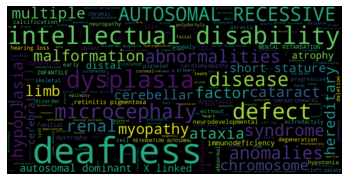

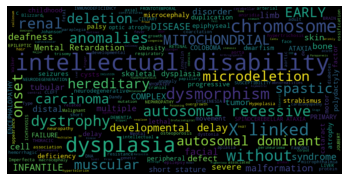

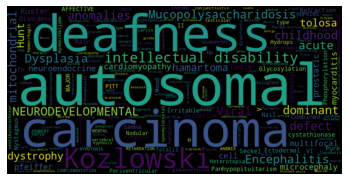

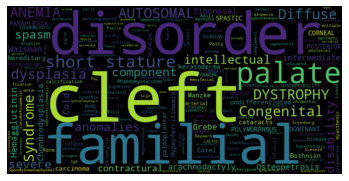

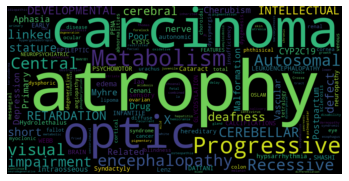

In [40]:
for cluster in tamaños_infomap[0:5].index.values:
    wordcloud_from_cluster(cluster)

In [41]:
def wordcount_from_cluster(cluster_id):
    cluster_nodes = graph_node_data[graph_node_data.comunidades_infomap == cluster_id]
    titles = cluster_nodes.node_name.values
    words = []
    for title in titles:
        split = title.split()
        for word in split:
            if word.casefold() not in filter:
                words.append(word)
    plt.figure(figsize=(15,8))
    plt.xticks(rotation=70)
    plt.hist(words)

#esto salio raro

# Especificidad

La idea es ver si un gen/enfermedad se relaciona con muchos nodos diferentes (baja especificidad) o no (alta especificidad). También compararlo con comunidades.

# Saco hubs

Voy a ir removiendo los nodos de grado muy alto de la red disease-disease y viendo como cambia el tamaño de la componente gigante

In [42]:
def gc_size(G):
    """Calcula el tamaño de la componente más grande del grafo"""
    return len(max(nx.connected_components(G), key=len))

In [43]:
disease_hubs = graph_node_data[graph_node_data.node_type == "disease"].sort_values(by="degree_dd", ascending=False)
highest_ranking = disease_hubs[0:10].node_idx.values

Estos son los 10 nodos enfermedad con más enlaces enfermedad-enfermedad:

*hasta multiple congenital anomalies puedo remover seguro

In [44]:
disease_hubs[0:10]

,node_idx,node_id,node_type,node_name,node_source,disgenet_type,diseaseClassMSH,diseaseClassNameMSH,degree_gda,degree_pp,degree_dd,comunidades_louvain,comunidades_infomap
29999,30000,C0019247,disease,Mendelian disease,primekg,NaN,NaN,NaN,0.0,0.0,907.0,12.0,389.0
28362,28363,CN225415,disease,syndromic intellectual disability,primekg,NaN,NaN,NaN,0.0,0.0,366.0,28.0,248.0
29078,29079,C0039082,disease,syndromic disease,primekg,NaN,NaN,NaN,0.0,0.0,342.0,3.0,94.0
33004,33005,CN228396,disease,multiple congenital anomalies/dysmorphic syndr...,primekg,NaN,NaN,NaN,0.0,0.0,279.0,11.0,199.0
34323,34324,CN205639,disease,genetic nervous system disorder,primekg,NaN,NaN,NaN,0.0,0.0,244.0,21.0,79.0
35174,35175,C0410787,disease,hereditary connective tissue disorder,primekg,NaN,NaN,NaN,0.0,0.0,147.0,35.0,294.0
34479,34480,CN206426,disease,syndromic genetic deafness,primekg,NaN,NaN,NaN,0.0,0.0,132.0,23.0,416.0
31018,31019,C0265388,disease,autosomal recessive disease,primekg,NaN,NaN,NaN,0.0,0.0,105.0,22.0,183.0
34312,34313,CN205539,disease,neurometabolic disease,primekg,NaN,NaN,NaN,0.0,0.0,84.0,1.0,21.0
28335,28336,C0265385,disease,autosomal dominant disease,primekg,NaN,NaN,NaN,0.0,0.0,79.0,6.0,194.0


In [45]:
G2 = G.copy()
sizes = [gc_size(G2)]
for hub in highest_ranking:
    G2.remove_node(hub)
    sizes.append(gc_size(G2))

fig = px.scatter(x=np.arange(len(sizes)),y=sizes,width=800, height=400, title="Tamaño de componente gigante al remover los 10 primeros hubs enfermedad").update_layout(xaxis_title="Ranking de nodo", yaxis_title="Tamaño CG")
fig.show()

print(f"Al remover el hub más importante pierdo {sizes[0]-sizes[1]} nodos de la componente gigante \nAl remover los primeros 10, en total, pierdo {sizes[0] - sizes[-1]}")

Al remover el hub más importante pierdo 687 nodos de la componente gigante 
Al remover los primeros 10, en total, pierdo 1044


Al remover esos nodos pierdo algunas asociaciones que no son disease-disease. Creo que esto pasa porque originalmente no estaban en la componente gigante, sino que son asociaciones GDA "sueltas", que al agregar enlaces d-d había conectado a la componente gigante. Esto me hace pensar que tengo que darle más importancia a la conectividad de la red para tratar de incluir más nodos en la GC. También tiene que ver con el tema de predecir GDA para nodos sin GDA previos: si están incluidos en la CG, puedo hacer predicciones igual, sino no.

In [46]:
lost_nodes = list(max(nx.connected_components(G), key=len) - max(nx.connected_components(G2), key=len))
graph_node_data[graph_node_data.node_idx.isin(lost_nodes)]

,node_idx,node_id,node_type,node_name,node_source,disgenet_type,diseaseClassMSH,diseaseClassNameMSH,degree_gda,degree_pp,degree_dd,comunidades_louvain,comunidades_infomap
4187,4188,387787,gene/protein,LIPT2,disgenet,NaN,NaN,NaN,1.0,0.0,0.0,NaN,NaN
5107,5108,50651,gene/protein,SLC45A1,disgenet,NaN,NaN,NaN,1.0,0.0,0.0,NaN,NaN
5598,5599,54112,gene/protein,GPR88,disgenet,NaN,NaN,NaN,1.0,0.0,0.0,NaN,NaN
20047,20048,C4310787,disease,"CHOREA, CHILDHOOD-ONSET, WITH PSYCHOMOTOR RETA...",disgenet,disease,NaN,NaN,1.0,0.0,1.0,NaN,NaN
20174,20175,C4479636,disease,INTELLECTUAL DEVELOPMENTAL DISORDER WITH NEURO...,disgenet,disease,NaN,NaN,1.0,0.0,1.0,1.0,28.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
35625,35626,CN244927,disease,Ververi-Brady syndrome,primekg,NaN,NaN,NaN,0.0,0.0,2.0,26.0,116.0
35626,35627,CN244943,disease,Jaberi-Elahi syndrome,primekg,NaN,NaN,NaN,0.0,0.0,2.0,5.0,117.0
35627,35628,CN248510,disease,"developmental delay, intellectual disability, ...",primekg,NaN,NaN,NaN,0.0,0.0,1.0,5.0,117.0
35628,35629,CN248526,disease,humerofemoral hypoplasia with radiotibial ray ...,primekg,NaN,NaN,NaN,0.0,0.0,1.0,26.0,116.0


# Distancias intercapa

Para los nodos que no tienen enlaces inter-capa, quiero ver cual es la distancia mínima que tienen a un nodo de otra capa. Es decir, si el nodo no se conecta directamente con la otra capa, cuantos pasos tengo que dar a través de nodos de la misma capa para llegar a la otra. 

Uso igraph porque hace más rápido estas cuentas y porque me deja pasarle listas de nodos para calcular las distancias.

In [128]:
nodos_intracapa = graph_node_data[graph_node_data.degree_gda == 0]
enf_intracapa = nodos_intracapa[(nodos_intracapa.node_type == "disease")].node_idx.values
gen_intracapa = nodos_intracapa[(nodos_intracapa.node_type == "gene/protein")].node_idx.values
complejos_intracapa = nodos_intracapa[nodos_intracapa.node_type == "protein_complex"].node_idx.values
#all_genes = graph_node_data[graph_node_data.node_type == "gene/protein"].node_idx.values
#all_enf = graph_node_data[graph_node_data.node_type == "disease"].node_idx.values
gen_intercapa = graph_node_data[(graph_node_data.degree_gda != 0) & (graph_node_data.node_type == "gene/protein")].node_idx.values
enf_intercapa = graph_node_data[(graph_node_data.degree_gda != 0) & (graph_node_data.node_type == "disease")].node_idx.values

Armo una versión igraph de mi grafo. Como igraph usa otra forma de indexar los nodos, me armo diccionarios para "traducir" entre mi nomenclatura y la de igraph.

In [40]:
G_igraph = ig.Graph.TupleList(G.edges(), directed=False)

#Tengo que "traducir" los ids de mi grafo a ids de igraph
vid2name = dict(zip(range(G_igraph.vcount()), G_igraph.vs['name']))
name2vid = dict((name, vid) for vid, name in vid2name.items())
gen_intercapa_vid = [name2vid[gen] for gen in gen_intercapa]
enf_intercapa_vid = [name2vid[enf] for enf in enf_intercapa]

Estas celdas tardan un poquito en correr

In [140]:
results_enf = {}
for enf in enf_intracapa:
    igraph_id = name2vid[enf]
    results_enf[enf] = min(G_igraph.shortest_paths(igraph_id,gen_intercapa_vid,mode="out")[0])

In [141]:
results_gen = {}
for gen in gen_intracapa:
    igraph_id = name2vid[gen]
    results_gen[gen] = min(G_igraph.shortest_paths(igraph_id,enf_intercapa_vid,mode="out")[0])

In [142]:
results_complex = {}
for com in complejos_intracapa:
    igraph_id = name2vid[com]
    results_complex[com] = min(G_igraph.shortest_paths(igraph_id,enf_intercapa_vid,mode="out")[0])

Combino todo en un dataframe para visualizar los resultados.

A los nodos totalmente desconectados de la otra capa les asigno valor negativo, a los nodos que tienen un enlace con la otra capa les asigno distancia 1.

In [ ]:
shortest_interlayer_length = pd.Series(pd.concat([pd.Series(results_enf, dtype="float64"),pd.Series(results_gen, dtype="float64"), pd.Series(results_complex, dtype="float64")]),name="Shortest_interlayer_length")
#le asigno valor negativo a los nodos totalmente desconectados de la otra capa
shortest_interlayer_length = shortest_interlayer_length.apply(lambda x: -1 if x == float("inf") else x)
node_interlayer_data = graph_node_data.join(shortest_interlayer_length, on="node_idx")
node_interlayer_data.loc[(graph_node_data["degree_gda"] != 0), 'Shortest_interlayer_length'] = 1

In [161]:
node_interlayer_data

,node_idx,node_id,node_type,node_name,node_source,disgenet_type,diseaseClassMSH,diseaseClassNameMSH,degree_gda,degree_pp,degree_dd,comunidades_louvain,comunidades_infomap,Shortest_interlayer_length
0,1,1,gene/protein,A1BG,disgenet,NaN,NaN,NaN,2.0,10.0,0.0,NaN,NaN,1.0
1,2,10,gene/protein,NAT2,disgenet,NaN,NaN,NaN,39.0,5.0,0.0,NaN,NaN,1.0
2,3,100,gene/protein,ADA,disgenet,NaN,NaN,NaN,18.0,7.0,0.0,NaN,NaN,1.0
3,4,1000,gene/protein,CDH2,disgenet,NaN,NaN,NaN,28.0,21.0,0.0,NaN,NaN,1.0
4,5,10000,gene/protein,AKT3,disgenet,NaN,NaN,NaN,9.0,41.0,0.0,NaN,NaN,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35637,35638,C3203657,disease,autoimmune retinopathy,primekg,NaN,NaN,NaN,0.0,0.0,4.0,9.0,45.0,2.0
35638,35639,C4510411,disease,growth hormone insensitivity with immune dysre...,primekg,NaN,NaN,NaN,0.0,0.0,2.0,11.0,152.0,3.0
35639,35640,C1970196,disease,adenosine kinase deficiency,primekg,NaN,NaN,NaN,0.0,0.0,2.0,6.0,436.0,2.0
35640,35641,C3272797,disease,colon serrated polyposis,primekg,NaN,NaN,NaN,0.0,0.0,1.0,1.0,23.0,3.0


Como ya había visto en "comparo grado inter e intra capa", la mayoría de los nodos G y D tienen enlaces "intercapa" o GDA. No existen los enlaces "GDA" para complejos de proteínas.

Observando todos los tipos de nodo juntos veo que (sacando los nodos "intercapa" que tienen distancia =1) la mayoría tiene distancia k=2 o k=3, pocos casos tienen distancia k > 3. Esto me indica una conectividad razonable entre capas y sugiere usar k=3 capas como máximo en la red de predicción.

In [163]:
interlayer_fig = px.histogram(node_interlayer_data["Shortest_interlayer_length"], title="All types and cases")
interlayer_fig.show()

Para enfermedades, curiosamente hay más nodos a distancia k=3 que k=2. Nuevamente sugiere considerar k=3 capas en la red de predicción. En cuanto a los nodos con distancias k>3, infiero que se trata de "cadenas" de nodos. Una inspección del grafo en Gephi me ayudó a reforzar esta idea, y además vimos que estas "cadenas" se tratan de clasificaciones cada vez más específicas de enfermedades, quizás no muy informativas para el problema que quiero resolver.

In [165]:
interlayer_fig = px.histogram(node_interlayer_data.loc[graph_node_data["node_type"] == "disease", "Shortest_interlayer_length"], title="Diseases")
interlayer_fig.show()

En este caso (sacando intercapa) la mayoría de los nodos está a distancia k=2 de la otra capa. La red de gen-gen tiene una buena conectividad con la capa de enfermedades.

In [167]:
interlayer_fig = px.histogram(node_interlayer_data.loc[graph_node_data["node_type"] == "gene/protein", "Shortest_interlayer_length"], title="Genes")
interlayer_fig.show()

Al igual que los nodos gen, los nodos complejo están mayormente a distancia k=2 de la capa enfermedades. Esto quiere decir que los complejos que agregué mayormente se enlazaron con genes que tienen enlaces GDA, están "cerca" de nodos enfermedad.

In [168]:
interlayer_fig = px.histogram(node_interlayer_data.loc[graph_node_data["node_type"] == "protein_complex", "Shortest_interlayer_length"], title="Complejos")
interlayer_fig.show()

# Análisis NLP de comunidades

Por un lado está la partición infomap, tengo criterios de similaridad de genes compartidos o similaridad TF-IDF. La idea es ver si los elementos de los clusters infomap son similares entre si segun estos criterios. 

Para cada cluster infomap, calcular la similaridad media de sus componentes y calcular una distribución de estos mismos valores para pares tomados al azar. 
Estandarizar: (z = x- <x>)/sigma -> sobre el sampleo nulo. También se puede ver el p-value.
Grafico z en función del tamaño.

Zgen vs ZIDF y tamaño-> tamaño del cluster y veo todo junto